In [50]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import pandas as pd

In [38]:
files = list(Path("outputs/").glob("*bold"))

In [39]:
def filter_notch(data, filt_val, freq, quality=5):
    b, a = signal.iirnotch(filt_val, quality, freq)
    y = signal.filtfilt(b, a, x=data, axis=0)
    b, a = signal.iirnotch(filt_val*2, quality, freq)
    y = signal.filtfilt(b, a, x=y, axis=0)
    b, a = signal.iirnotch(filt_val*3, quality, freq)
    y = signal.filtfilt(b, a, x=y, axis=0)
    return y
def butter_bandpass(lowcut, highcut, fs, order=3):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = signal.butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=3):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = signal.filtfilt(b, a, data)
    return y

In [31]:
8250*(0.8/11)

600.0000000000001

In [43]:
def extract_max_freq(resp_trace, sampling_rate):
    fourier_transform = np.fft.rfft(resp_trace)
    abs_fourier_transform = np.abs(fourier_transform)
    power_spectrum = np.square(abs_fourier_transform)
    frequency = np.linspace(0, sampling_rate/2, len(power_spectrum))
    assert len(power_spectrum) == len(frequency)
    plt.plot(frequency, power_spectrum),
    plt.xlim(0, 1),
    plt.show()
    return frequency[np.argmax(power_spectrum)]

In [73]:
filt_motion[:, -2].reshape((len(filt_motion), 1))

array([[0.00894652],
       [0.00062945],
       [0.00153734],
       ...,
       [0.1       ],
       [0.1       ],
       [0.1       ]])

(0, 1000)

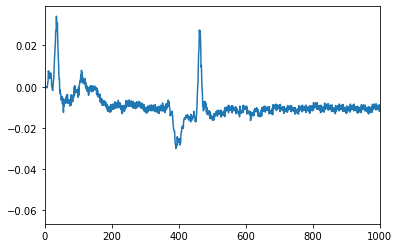

In [118]:
from scipy.linalg import lstsq, svd
filt_motion = filter_notch(motion, 1/0.8, 1/(0.8/11))
u, s, v = svd(filt_motion[:, (3,5)])

plt.plot(u[:, 0])
plt.xlim(0, 1000)

In [119]:
u.shape

(8250, 8250)

(200, 250)

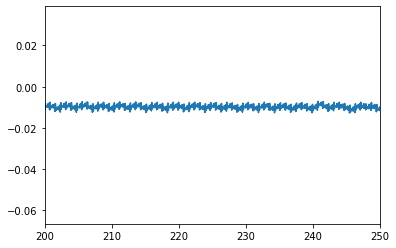

In [126]:
plt.plot(np.arange(0, 8250*(0.8/11), 0.8/11), u[:, 0])
plt.xlim(200, 250)

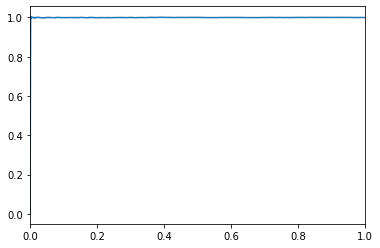

0.0016666666666666666

In [132]:
demean = u[:, 3] - u[:, 3].mean()
extract_max_freq(demean, 1/(0.8/11))

In [69]:
lstsq?

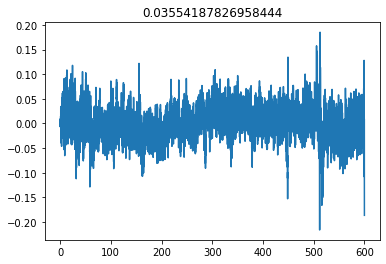

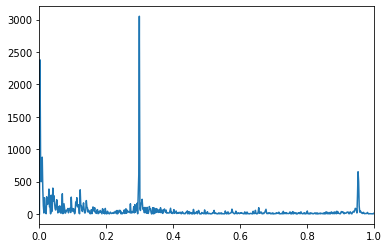

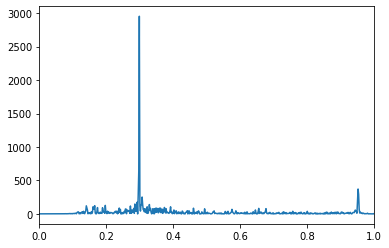

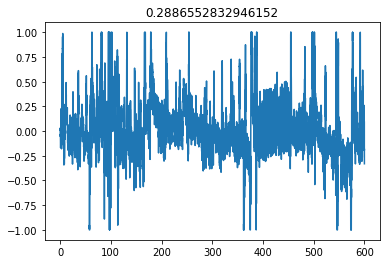

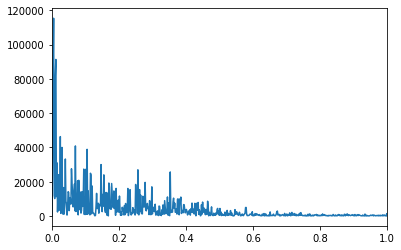

...

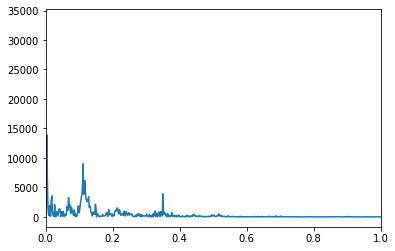

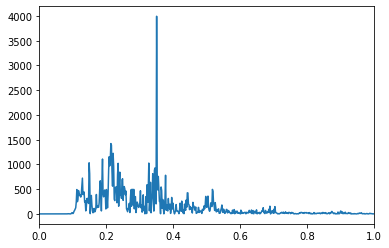

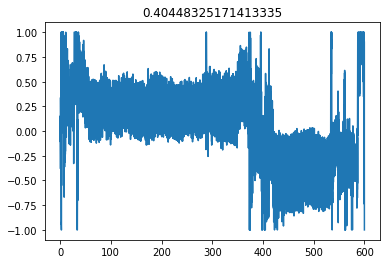

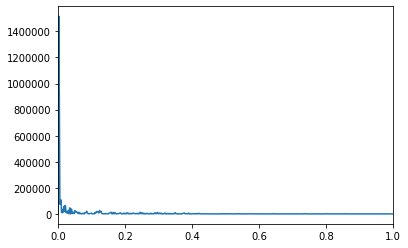

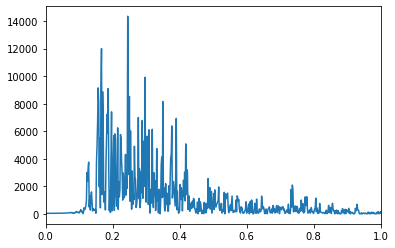

In [98]:
x = []
for f in files:
    motion = np.genfromtxt(f)
    if len(motion) != 8250:
        continue
    filt_motion = filter_notch(motion, 1/0.8, 1/(0.8/11))
    a, _, _, _ = lstsq(filt_motion[:, :-1], filt_motion[:, -1])
    filt_motion[:, -1] = filt_motion[:, -1] - a@filt_motion[:, :-1].T
    filt_motion = np.clip(filt_motion, -1, 1)
    plt.plot(np.arange(0, 8250*(0.8/11), 0.8/11), filt_motion[:, -1:])
    #plt.xlim(200,250)
    plt.title(filt_motion[:, -1].std())
    plt.show()
    demean = filt_motion[:, -1] - filt_motion[:, -1].mean()
    extract_max_freq(demean, 1/(0.8/11))
    bp = butter_bandpass_filter(demean, 0.12, 1, 1/(0.72/9), order=3)
    max_bp = extract_max_freq(bp, 1/(0.8/11))
    x.append({
        "name": f,
        "std": filt_motion[:, -1].std(), 
        "range": filt_motion[:, -1].max()-filt_motion[:, -1].min(),
        "max_freq": max_bp
    })

In [92]:
a

array([-1.51130103, -3.10491518,  3.83331655])

In [63]:
df = pd.DataFrame(x); df.head()

,max_freq,name,range,std
0,0.298333,outputs/sub-PA177_ses-V1W1_task-REST_run-1_bold,0.15175,0.022122
1,0.353333,outputs/sub-PA059_ses-V1W1_task-REST_run-1_bold,0.20000,0.088228
2,0.115000,outputs/sub-PA088_ses-V1W1_task-REST_run-1_bold,0.20000,0.090493
3,0.105000,outputs/sub-PA132_ses-V1W1_task-REST_run-1_bold,0.20000,0.036328
4,0.380000,outputs/sub-PA096_ses-V1W1_task-REST_run-1_bold,0.20000,0.047146


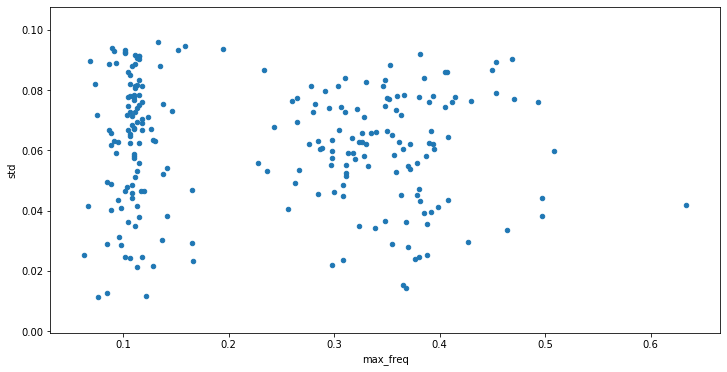

In [64]:

df.plot.scatter("max_freq", "std", figsize=(12,6))

(2000, 2100)

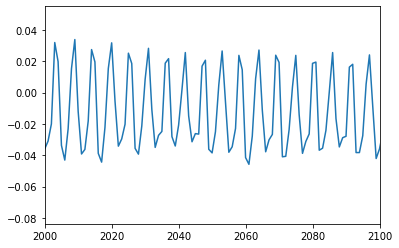

In [25]:
plt.plot(motion[:, -5])
plt.xlim(2000, 2100)

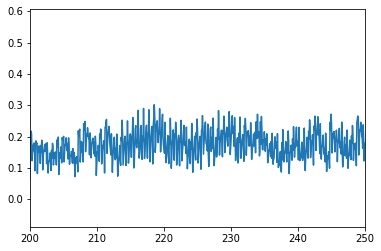